In [157]:
import cv2 as cv
import cv2
import os
from PIL import Image, ImageDraw
from IPython.display import display
import numpy as np
import matplotlib.pyplot as plt
import rawpy
import imageio
from pyscikit import ImgKit
import tqdm
import exiftool


In [187]:
# raw2 = np.fromfile("M00ff.raw", dtype=np.uint8)
# raw2 = np.reshape(raw2,(1024,1280,1))
# imageio.imsave('M00ff.tif', raw2)
import subprocess
subprocess.call(['ping', '8.8.8.8']) # 数组作为参数运行命令


0

# Convert RAW file to DNG file
Firstly convert raw into TIF, then TIF into DNG

In [194]:
# dirpath = 'D:/TCL/data_collection/20210702PM_ZOO/'
# my_files = [f.name for f in os.scandir(dirpath) if f.name.endswith('.raw')]
# for one in tqdm.tqdm(my_files):
#     raw2 = np.fromfile(os.path.join(dirpath, one), dtype=np.uint8)
#     raw2 = np.reshape(raw2,(1024,1280,1))
#     imageio.imsave(os.path.join(dirpath, one+'.tif'), raw2)
# #     with exiftool.ExifTool("./exiftool.exe") as et:
#     cmd_str ="./exiftool.exe   -@ pbpx_exft_args.txt   -o %(outputdngname)s  %(tifname)s" % {"outputdngname": dirpath + one+'.dng', "tifname": dirpath + one+'.tif'}
# #         print(cmd_str)
# #         print(os.getcwd())
# #         print(os.popen(cmd_str).read())
#     a=os.system(cmd_str)  #使用a接收返回值
# #         a=os.popen(cmd_str)
#     print(a)
# #         output_file = "-o=%(outputdngname)s"% {"outputdngname": dirpath + one+'.dng'}
# #         input_file = dirpath + one+'.tif'
# #         out = et.execute_json('-@ pbpx_exft_args.txt',output_file.encode('utf-8') ,  input_file.encode('utf-8'))
# #         print(out)
# #      ./exiftool.exe   -@ pbpx_exft_args.txt   -o 0x07ff.dng  07ff.tif

[85 39 39 40 41 38 39 39 38 38]
[85 27 17 26 18 27 18 26 17 28]


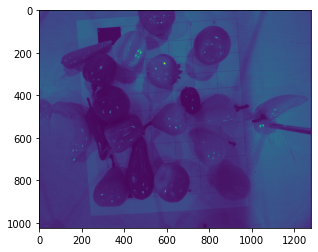

In [33]:

raw1 = np.fromfile(os.path.join(dirpath, "M00009_48mp_0x8_0x07ff.raw"), dtype=np.uint8)
raw2 = np.fromfile(os.path.join(dirpath, "C00009_48mp_0x8_0x0fff.raw"), dtype=np.uint8)
# print(raw2.shape)
# print(raw1[:10])
raw1 = np.reshape(raw1,(1024,1280,1))
raw2 = np.reshape(raw2,(1024,1280,1))
# print(raw1.shape)
imageio.imsave('M00009_48mp_0x8_0x07ff.tif', raw1)
imageio.imsave('C00009_48mp_0x8_0x07ff.tif', raw2)
print(raw1[:10,0,0])
print(raw2[:10,0,0])
plt.imshow(raw1)

In [45]:
rawtif = imageio.imread('M00009_48mp_0x8_0x07ff.tif')
print(rawtif.shape)
rawtif = np.reshape(rawtif,(1024,1280,1))
print(rawtif[:10,0,0])

(1024, 1280)
[85 39 39 40 41 38 39 39 38 38]


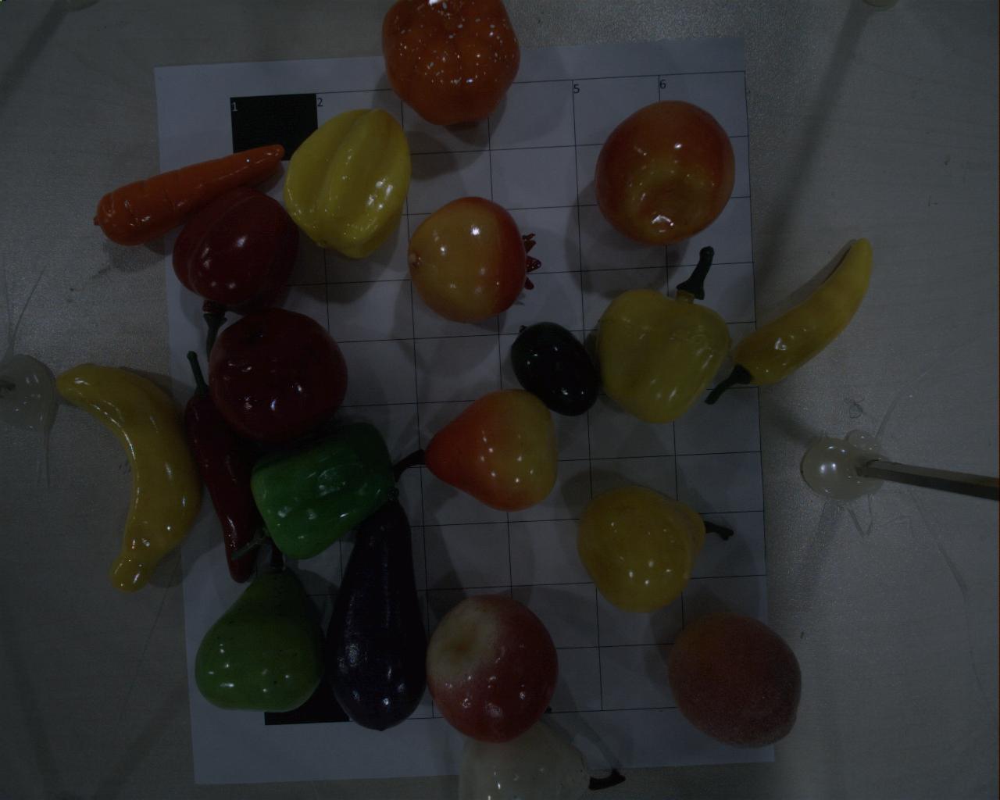

In [199]:
# filepath = os.path.join(dirpath, "M00009_48mp_0x8_0x07ff.raw")
# filepath = 'C00009_48mp_0x8_0x1fff.dng'
# filepath = 'C00009_48mp_0x8_0x07ff.dng'
filepath = '0x07ff.dng'
with rawpy.imread(filepath) as raw:
    rgbimg = raw.postprocess(use_camera_wb=True, half_size=False, no_auto_bright=True, output_bps=8)
img = Image.fromarray(rgbimg)
display(img)
imageio.imsave('0x07ff.jpg', rgbimg)

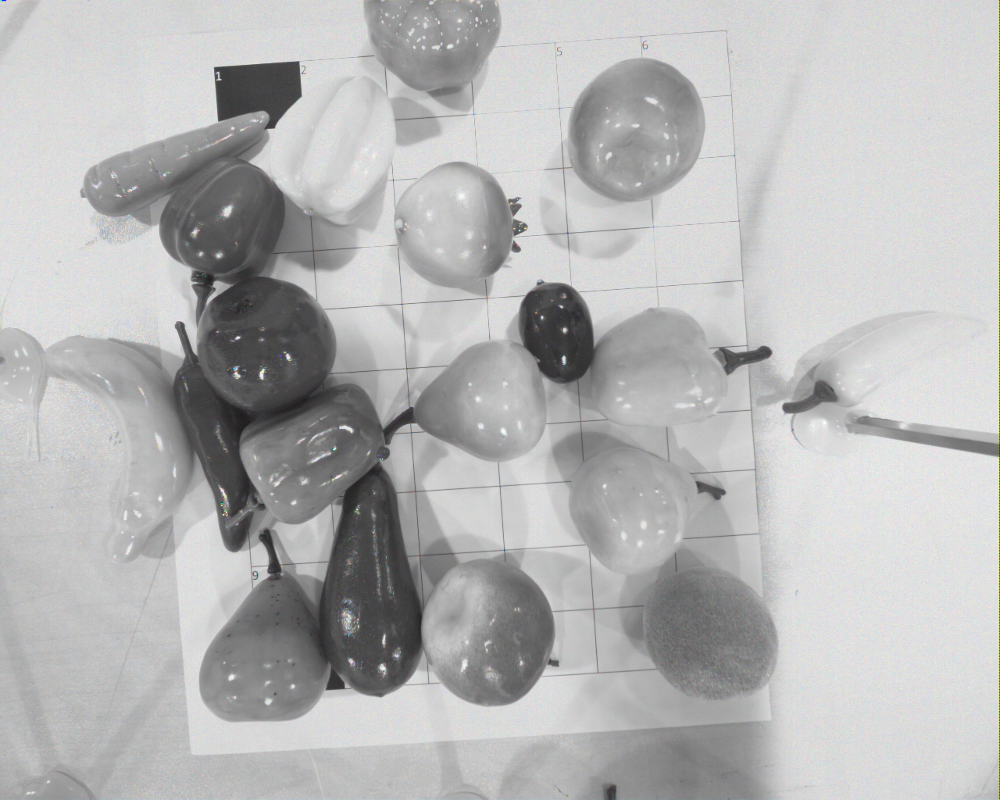

In [195]:
# filepath = 'C00009_48mp_0x8_0x1fff.dng'
filepath = 'M00009_48mp_0x8_0x1fff.dng'
with rawpy.imread(filepath) as raw:
    grayimg = raw.postprocess(use_camera_wb=True, half_size=False, no_auto_bright=True, output_bps=8)
img = Image.fromarray(grayimg)
display(img)

In [ ]:
def extract_bayer_channels(raw):

    ch_B  = raw[1::2, 1::2]
    ch_Gb = raw[0::2, 1::2]
    ch_R  = raw[0::2, 0::2]
    ch_Gr = raw[1::2, 0::2]

    return ch_R, ch_Gr, ch_B, ch_Gb

In [ ]:
ch_R, ch_Gr, ch_B, ch_Gb = extract_bayer_channels(raw2)
#     # 拼合四通道一起
# raw_orig_image = np.stack((ch_R, ch_Gr, ch_Gb, ch_B))
# raw数据一般是16位，有效位可能为16,14,12,10等。常见位12位
# png_image = raw_image.astype(np.uint16)
# new_name = raw_file.replace(".dng", ".png")
# imageio.imwrite(new_name, png_image)
# png_image = raw2.postprocess()
# png_image = raw.postprocess(use_camera_wb=True, half_size=False, no_auto_bright=True, output_bps=16)
# colour = cv2.cvtColor(raw_image, cv2.COLOR_BAYER_BG2BGR)
img = Image.fromarray(ch_R).resize((256,256))
img.show()

In [ ]:
import asyncio
from pydngconverter import DNGConverter, flags
# dirpath = 'D:/TCL/data_collection/20210702PM_ZOO/'

async def main():
    # Create converter instance.
    pydng = DNGConverter(dirpath,
                        dest='D:/TCL/data_collection/20210702PM_ZOO_dngfiles/',
                        jpeg_preview=flags.JPEGPreview.EXTRACT,
                        fast_load=True,
                        )
    # Convert all
    return await pydng.convert()

loop = asyncio.get_event_loop()
loop.run_until_complete(main())
loop.close()

In [89]:
def alignImages(im1, im2):

  # Convert images to grayscale
  im1Gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
  im2Gray = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
  
  # Detect ORB features and compute descriptors.
  orb = cv2.ORB_create(MAX_MATCHES)
  keypoints1, descriptors1 = orb.detectAndCompute(im1Gray, None)
  keypoints2, descriptors2 = orb.detectAndCompute(im2Gray, None)
  
  # Match features.
  matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
  matches = matcher.match(descriptors1, descriptors2, None)
  
  # Sort matches by score
  matches.sort(key=lambda x: x.distance, reverse=False)

  # Remove not so good matches
  numGoodMatches = int(len(matches) * GOOD_MATCH_PERCENT)
  matches = matches[:numGoodMatches]

  # Draw top matches
  imMatches = cv2.drawMatches(im1, keypoints1, im2, keypoints2, matches, None)
  cv2.imwrite("matches.jpg", imMatches)
  
  # Extract location of good matches
  points1 = np.zeros((len(matches), 2), dtype=np.float32)
  points2 = np.zeros((len(matches), 2), dtype=np.float32)

  for i, match in enumerate(matches):
    points1[i, :] = keypoints1[match.queryIdx].pt
    points2[i, :] = keypoints2[match.trainIdx].pt
  
  # Find homography
  h, mask = cv2.findHomography(points1, points2, cv2.RANSAC)

  # Use homography
  height, width, channels = im2.shape
  im1Reg = cv2.warpPerspective(im1, h, (width, height))
  
  return im1Reg, h

def alignImages2(im1, im2,rawim):

  # Convert images to grayscale
  im1Gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
  im2Gray = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
  
  # Detect ORB features and compute descriptors.
  orb = cv2.ORB_create(MAX_MATCHES)
  keypoints1, descriptors1 = orb.detectAndCompute(im1Gray, None)
  keypoints2, descriptors2 = orb.detectAndCompute(im2Gray, None)
  
  # Match features.
  matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
  matches = matcher.match(descriptors1, descriptors2, None)
  
  # Sort matches by score
  matches.sort(key=lambda x: x.distance, reverse=False)

  # Remove not so good matches
  numGoodMatches = int(len(matches) * GOOD_MATCH_PERCENT)
  matches = matches[:numGoodMatches]

  # Draw top matches
  imMatches = cv2.drawMatches(im1, keypoints1, im2, keypoints2, matches, None)
  cv2.imwrite("matches.jpg", imMatches)
  
  # Extract location of good matches
  points1 = np.zeros((len(matches), 2), dtype=np.float32)
  points2 = np.zeros((len(matches), 2), dtype=np.float32)

  for i, match in enumerate(matches):
    points1[i, :] = keypoints1[match.queryIdx].pt
    points2[i, :] = keypoints2[match.trainIdx].pt
  
  # Find homography
  h, mask = cv2.findHomography(points1, points2, cv2.RANSAC)

  # Use homography
  height, width, channels = im2.shape
  im1Reg = cv2.warpPerspective(im1, h, (width, height))
  rawimReg = cv2.warpPerspective(rawim, h, (width, height))
  
  return im1Reg,rawimReg, h


Aligning images ...
Saving aligned image :  aligned.jpg
Estimated homography : 
 [[ 9.93648728e-01  1.00788293e-02 -1.46890888e+01]
 [-1.16915203e-02  9.99620981e-01 -4.43767768e+01]
 [-7.84412993e-06  4.52614615e-06  1.00000000e+00]]


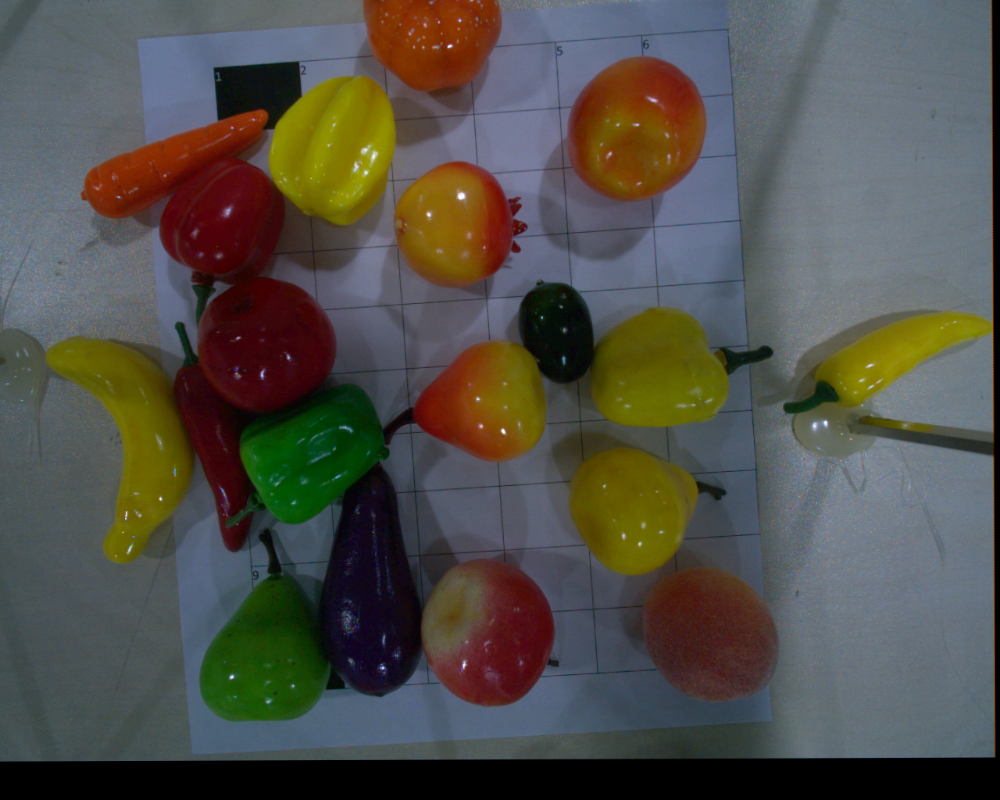

In [90]:
#  # Read reference image
#   refFilename = "form.jpg"
#   print("Reading reference image : ", refFilename)
#   imReference = cv2.imread(refFilename, cv2.IMREAD_COLOR)

#   # Read image to be aligned
#   imFilename = "scanned-form.jpg"
#   print("Reading image to align : ", imFilename);  
#   im = cv2.imread(imFilename, cv2.IMREAD_COLOR)

MAX_MATCHES = 500
GOOD_MATCH_PERCENT = 0.15

print("Aligning images ...")
  # Registered image will be resotred in imReg. 
  # The estimated homography will be stored in h. 
# imReg, h = alignImages(rgbimg, grayimg)
imReg,raw2Reg, h = alignImages2(rgbimg, grayimg,raw2)
  
  # Write aligned image to disk. 
outFilename = "aligned.jpg"
print("Saving aligned image : ", outFilename); 
cv2.imwrite(outFilename, imReg)

  # Print estimated homography
print("Estimated homography : \n",  h)
  
img = Image.fromarray(imReg)
display(img)

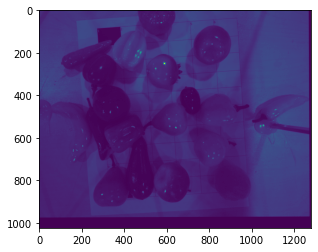

In [91]:
plt.imshow(raw2Reg)

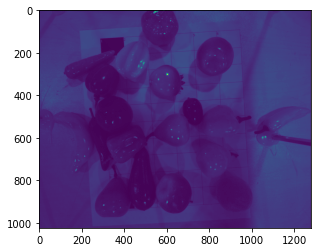

In [84]:
raw2 = np.fromfile(os.path.join(dirpath, "C00009_48mp_0x8_0x0fff.raw"), dtype=np.uint8)
# print(raw2.shape)
# print(raw1[:10])
raw2 = np.reshape(raw2,(1024,1280,1))
plt.imshow(raw2)

In [ ]:
height, width, channels = im2.shape
im1Reg = cv2.warpPerspective(im1, h, (width, height))
  

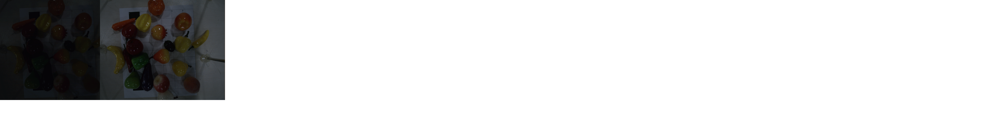

In [147]:
canvas = ImgKit.displayImages([rgbimg,grayimg],1,10,img_size=(1280,1024))

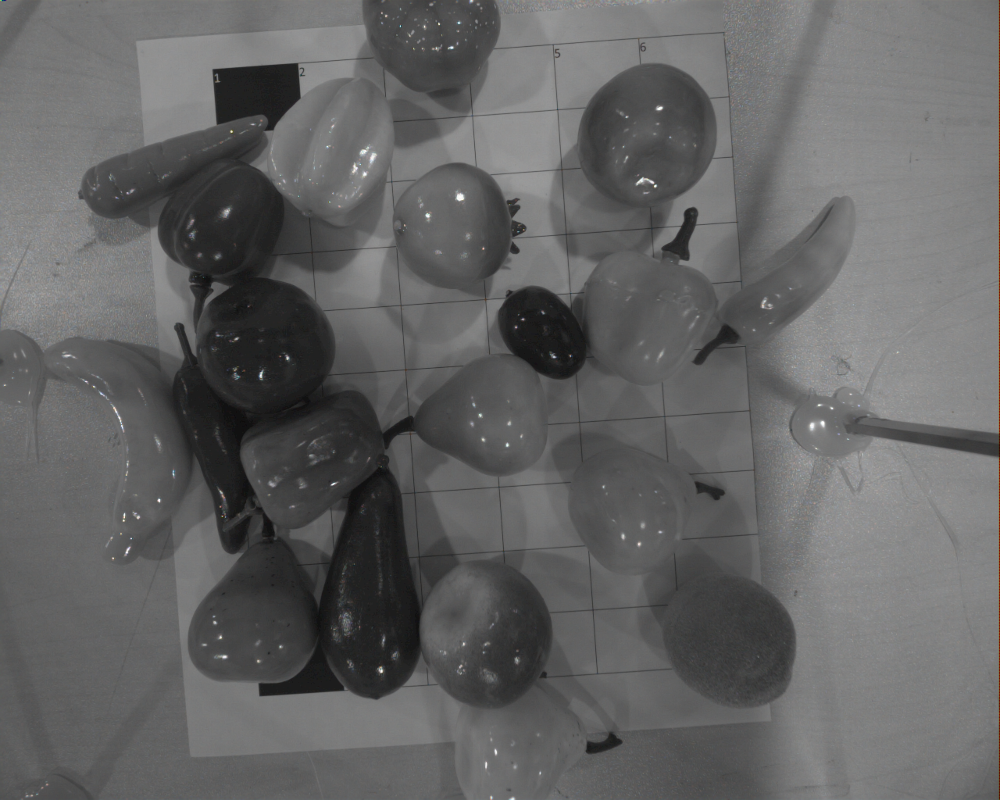

In [148]:
# filepath = 'C00009_48mp_0x8_0x1fff.dng'
filepath = 'M0x07ff.dng'
with rawpy.imread(filepath) as raw:
    grayimg = raw.postprocess(use_camera_wb=True, half_size=False, no_auto_bright=True, output_bps=8)
img = Image.fromarray(grayimg)
display(img)

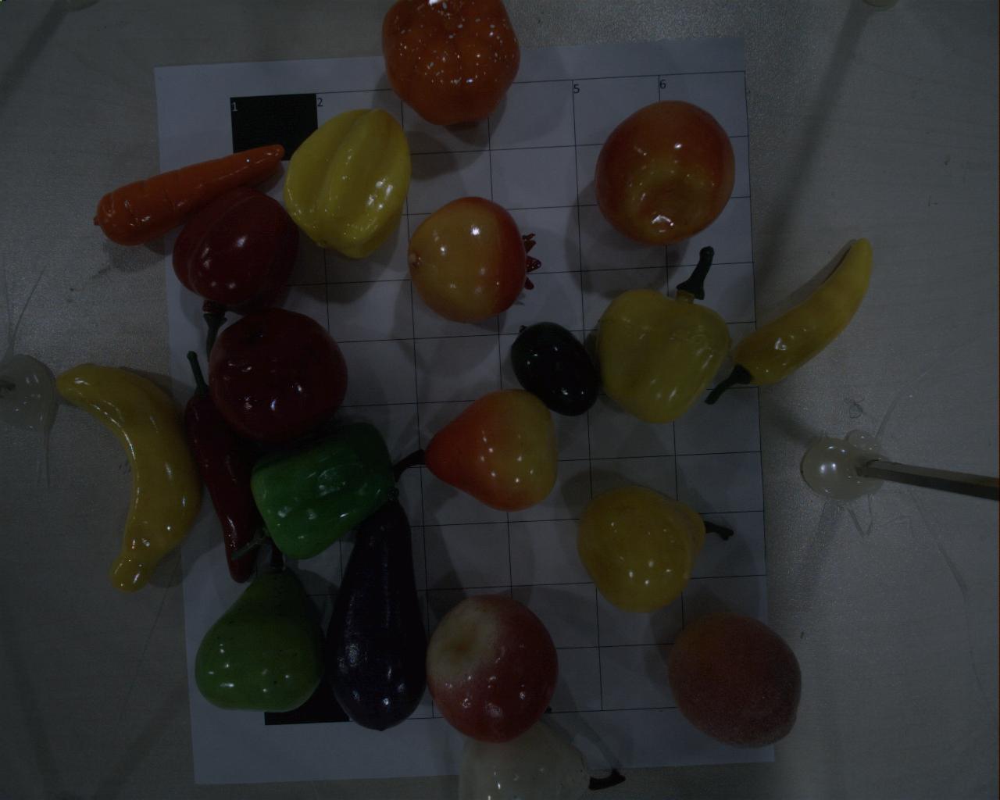

In [129]:
# filepath = 'C00009_48mp_0x8_0x1fff.dng'
filepath = '0x07ff.dng'
with rawpy.imread(filepath) as raw:
    grayimg = raw.postprocess(use_camera_wb=True, half_size=False, no_auto_bright=True, output_bps=8)
img = Image.fromarray(grayimg)
display(img)